In [5]:
# importing libraries and dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
import yfinance as yf
import plotly.graph_objects as go
from MCForecastTools import MCSimulation
import hvplot.pandas
import warnings
warnings.filterwarnings('ignore')

Importing from Excel File

In [6]:
tickers = pd.read_excel('FA_STOCKS_LIST.xlsx',index_col=0)

In [7]:
tickers.head(5)

,Symbol
Company,
Reliance,RELIANCE.NS
Hdfc,HDFC.NS
Itc,ITC.NS
Hindustan_Unilever,HINDUNILVR.NS
L&T,LT.NS


Cleaning data

In [8]:
symbols = [str(i) for i in tickers['Symbol']if not pd.isnull(i)]

In [9]:
symbols

['RELIANCE.NS',
 'HDFC.NS',
 'ITC.NS',
 'HINDUNILVR.NS',
 'LT.NS',
 'SBIN.NS',
 'GRASIM.NS',
 'HEROMOTOCO.NS',
 'HINDALCO.NS',
 'TATAMOTORS.NS',
 'DRREDDY.NS',
 'HDFCBANK.NS']

In [13]:
len(symbols)

12

In [10]:
# Creating DataFrame
df_master = pd.DataFrame()

In [11]:
for i in symbols:
    tmp1 = yf.Ticker(i).history(period ='15y')
    tmp1['Symbol'] = i
    if df_master.shape[0] !=0:
        df_master = df_master.append(tmp1)
    else:
        df_master = tmp1

In [12]:
df_master

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Symbol
Date,,,,,,,,
2007-10-12,584.512712,604.984532,564.385040,569.691772,40168929,0.0,0.0,RELIANCE.NS
2007-10-15,573.987993,595.059287,572.011868,592.028503,19870491,0.0,0.0,RELIANCE.NS
2007-10-16,589.508548,599.489096,581.515233,588.742493,22767070,0.0,0.0,RELIANCE.NS
2007-10-17,559.089487,600.610446,499.805562,596.735901,34832307,0.0,0.0,RELIANCE.NS
2007-10-18,610.602051,663.668936,560.865718,573.555176,30584233,0.0,0.0,RELIANCE.NS
...,...,...,...,...,...,...,...,...
2022-10-06,1459.949951,1462.599976,1434.199951,1437.000000,6274599,0.0,0.0,HDFCBANK.NS
2022-10-07,1430.250000,1434.949951,1420.349976,1430.800049,6648997,0.0,0.0,HDFCBANK.NS
2022-10-10,1408.000000,1426.000000,1398.199951,1415.000000,6554651,0.0,0.0,HDFCBANK.NS


saving all data in single csv file

In [23]:
master = df_master.to_csv(f"FA_Stocks.csv")

In [13]:
# Reading from csv
Fa = pd.read_csv("FA_Stocks.csv").set_index("Date")

In [14]:
Fa

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Symbol
Date,,,,,,,,
2007-10-11,590.396669,590.396669,573.388652,584.079712,19798410,0.0,0.0,RELIANCE.NS
2007-10-12,584.512775,604.984597,564.385100,569.691833,40168929,0.0,0.0,RELIANCE.NS
2007-10-15,573.988171,595.059471,572.012045,592.028687,19870491,0.0,0.0,RELIANCE.NS
2007-10-16,589.508548,599.489096,581.515233,588.742493,22767070,0.0,0.0,RELIANCE.NS
2007-10-17,559.089430,600.610385,499.805511,596.735840,34832307,0.0,0.0,RELIANCE.NS
...,...,...,...,...,...,...,...,...
2022-10-04,1429.500000,1458.000000,1426.150024,1453.000000,5769263,0.0,0.0,HDFCBANK.NS
2022-10-06,1459.949951,1462.599976,1434.199951,1437.000000,6274599,0.0,0.0,HDFCBANK.NS
2022-10-07,1430.250000,1434.949951,1420.349976,1430.800049,6648997,0.0,0.0,HDFCBANK.NS


In [20]:
syms = Fa["Symbol"].unique().tolist()
syms

['RELIANCE.NS',
 'HDFC.NS',
 'ITC.NS',
 'HINDUNILVR.NS',
 'LT.NS',
 'SBIN.NS',
 'GRASIM.NS',
 'HEROMOTOCO.NS',
 'HINDALCO.NS',
 'TATAMOTORS.NS',
 'DRREDDY.NS',
 'HDFCBANK.NS']

In [21]:
ndf = Fa.copy()

In [22]:
ndf

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Symbol
Date,,,,,,,,
2007-10-11,590.396669,590.396669,573.388652,584.079712,19798410,0.0,0.0,RELIANCE.NS
2007-10-12,584.512775,604.984597,564.385100,569.691833,40168929,0.0,0.0,RELIANCE.NS
2007-10-15,573.988171,595.059471,572.012045,592.028687,19870491,0.0,0.0,RELIANCE.NS
2007-10-16,589.508548,599.489096,581.515233,588.742493,22767070,0.0,0.0,RELIANCE.NS
2007-10-17,559.089430,600.610385,499.805511,596.735840,34832307,0.0,0.0,RELIANCE.NS
...,...,...,...,...,...,...,...,...
2022-10-04,1429.500000,1458.000000,1426.150024,1453.000000,5769263,0.0,0.0,HDFCBANK.NS
2022-10-06,1459.949951,1462.599976,1434.199951,1437.000000,6274599,0.0,0.0,HDFCBANK.NS
2022-10-07,1430.250000,1434.949951,1420.349976,1430.800049,6648997,0.0,0.0,HDFCBANK.NS


In [46]:
# Calculating Simple Moving Averages 20,50 and 100 days
def ma_plot(sma20,sma50,sma100):

    """
    Function For Plotting Moving Averages
    """
#     setting the figure of daily closing prices
    ax = dataf.plot(figsize=(25,10))
#     overlay SMA20,SMA50,SMA100 on the same figure
    sma20.plot(ax=ax)
    sma50.plot(ax=ax)
    sma100.plot(ax=ax)
#     set the legend of figure
    ax.legend(['Original','SMA20','SMA50','SMA100']);
    plt.show()
    
    

In [82]:
def results():
    
    for sym in syms:
#         print('\033[1m' + f"{sym} stock is being analyzed and forecasted" + '\033[0m')
#         dataf = ndf[ndf["Symbol"] == sym]
    #print(dataf)
#         def results():
            print('\033[1m' + f"{sym} stock is being analyzed and forecasted" + '\033[0m')
            dataf = ndf[ndf["Symbol"] == sym]
            
    
    #drop columns except close
            dataf.drop(columns=["Open", "Low", "High", "Volume", "Dividends", "Stock Splits", "Symbol"], inplace=True)
    #print(dataf)
    
    #rename column to 
            dataf.rename(columns={"Close":"close"}, inplace=True)
    #display(dataf)  #display is used here because print will not view as table
    
    #info = dataf.info()
    #print(f"Information on {sym} stock data: ", info)
    #print()
    
    #Stock riskiness
            volatility = (dataf.std() * np.sqrt(252)).sort_values()
            print(f"Volatility on {sym} stock: ", volatility)
            print()
    
    #Daily Returns
            daily_returns = dataf.pct_change().dropna()
    #print(f"Daily returns on {sym} stock: ", daily_returns)
    
    #Details on Null values
            print("Mean of null values: ", dataf.isnull().mean() * 100)
            print("Sum of null values: ", dataf.isnull().sum())
    
            plot = dataf.hvplot(label= f"{sym} Price Over Last 25 Years")
            plt.show #plot  #need to work on this
    
    #20 days moving average
            sma20 = (dataf.rolling(window=20).mean())
            display(f"Moving average stock with 20 days  of {sym}", sma20.dropna())
    #sma20.dropna()
    
            sma50 = dataf.rolling(window=50).mean()
            display(f"Moving average stock with 50 days  of {sym}", sma50.dropna())
    #sma50.dropna()
    
            sma100 = dataf.rolling(window=100).mean()
            display(f"Moving average stock with 100 days  of {sym}", sma100.dropna())
    #sma100.dropna()
    
            ma_plot(sma20, sma50, sma100)
    
    
    #the next few lines is for forecasting for the next 5 years
    #print(dataf.index)
    
            ticker_data = pd.concat([dataf],axis=1,keys=[sym])
            display(ticker_data)
    
    #Monte carlo simualtion
            MC_Sim = MCSimulation(
            portfolio_data = ticker_data,
            num_simulation = 1000,
            num_trading_days = 252*5
            )
            display(MC_Sim.portfolio_data.head().dropna())
    
    
    #Cummulative return
            MC_Sim.calc_cumulative_return()   #the printing line from the imported file for this function has been removed
    
    
    #Monte Carlo plot
            line_plot = MC_Sim.plot_simulation()
            plt.show()
            print()

    
    #Monte Carlo distribution plot
            dist_plot = MC_Sim.plot_distribution()
            plt.show()
            print()
    
    
    #Monte carlo sum
            MC_sum = MC_Sim.summarize_cumulative_return()
            print(MC_sum)
            print()
    
    # Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our ₹10,000 investments in  stock
            ci_lower = round(MC_sum[8]*10000, 2)
            ci_upper = round(MC_sum[9]*10000, 2)

    # Print results
            print(f"There is a 95% chance that an initial investment of  ₹10,000 in the stock"
                  f" over the next 5 years will end within in the range of"
                  f" ₹{ci_lower} and ₹{ci_upper}.")
    


    
            print()
            print()
            print()
# print(results)   


RELIANCE.NS stock is being analyzed and forecasted
Volatility on RELIANCE.NS stock:  close    10734.353891
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of RELIANCE.NS'

,close
Date,
2007-11-07,589.273734
2007-11-08,590.520468
2007-11-12,591.739999
2007-11-13,592.036972
2007-11-14,594.667001
...,...
2022-10-04,2481.847510
2022-10-06,2473.865015
2022-10-07,2466.212524


'Moving average stock with 50 days  of RELIANCE.NS'

,close
Date,
2007-12-20,610.807223
2007-12-24,611.508861
2007-12-26,612.977634
2007-12-27,613.987903
2007-12-28,615.068337
...,...
2022-10-04,2534.223979
2022-10-06,2532.754248
2022-10-07,2533.138560


'Moving average stock with 100 days  of RELIANCE.NS'

,close
Date,
2008-03-03,602.823098
2008-03-04,601.963036
2008-03-05,601.356874
2008-03-07,600.428537
2008-03-10,599.591457
...,...
2022-10-04,2537.111865
2022-10-06,2537.139705
2022-10-07,2537.264062


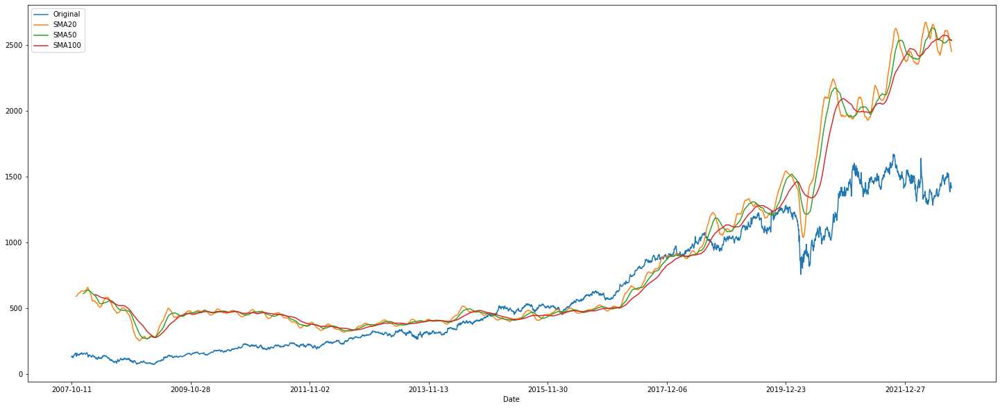

,RELIANCE.NS
,close
Date,
2007-10-11,584.079712
2007-10-12,569.691833
2007-10-15,592.028687
2007-10-16,588.742493
2007-10-17,596.735840
...,...
2022-10-04,2413.199951
2022-10-06,2422.100098


RELIANCE.NS             
                 close daily_return
Date                               
2007-10-12  569.691833    -0.024633
2007-10-15  592.028687     0.039209
2007-10-16  588.742493    -0.005551
2007-10-17  596.735840     0.013577

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

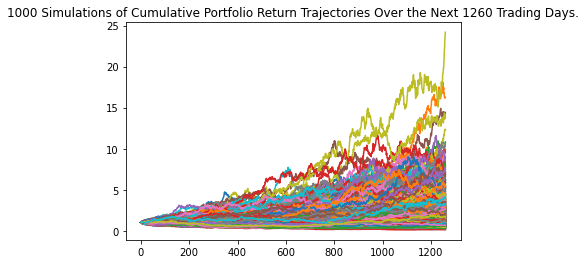

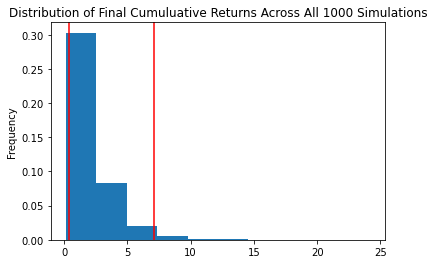


count           1000.000000
mean               2.132038
std                1.919951
min                0.123376
25%                0.969958
50%                1.589105
75%                2.621396
max               24.189771
95% CI Lower       0.410096
95% CI Upper       7.132048
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹4100.96 and ₹71320.48.



HDFC.NS stock is being analyzed and forecasted
Volatility on HDFC.NS stock:  close    11668.082114
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of HDFC.NS'

,close
Date,
2007-11-07,422.877243
2007-11-08,423.211652
2007-11-12,423.532979
2007-11-13,423.696097
2007-11-14,425.220560
...,...
2022-10-04,2382.714990
2022-10-06,2377.129993
2022-10-07,2370.992493


'Moving average stock with 50 days  of HDFC.NS'

,close
Date,
2007-12-20,440.502057
2007-12-24,441.725062
2007-12-26,443.079214
2007-12-27,444.219148
2007-12-28,445.369875
...,...
2022-10-04,2394.241992
2022-10-06,2394.644995
2022-10-07,2395.009995


'Moving average stock with 100 days  of HDFC.NS'

,close
Date,
2008-03-03,453.051875
2008-03-04,453.225784
2008-03-05,453.698208
2008-03-07,453.802127
2008-03-10,453.768359
...,...
2022-10-04,2297.034988
2022-10-06,2299.136797
2022-10-07,2300.960063


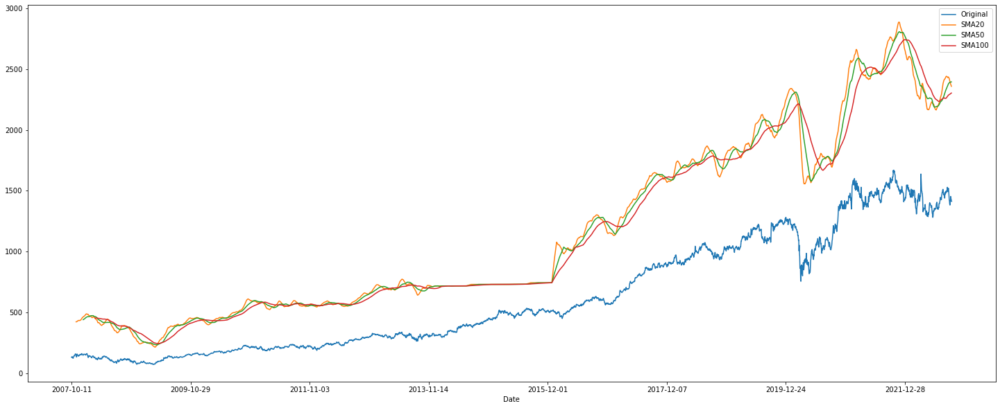

,HDFC.NS
,close
Date,
2007-10-11,412.835571
2007-10-12,405.174408
2007-10-15,418.894135
2007-10-16,420.995453
2007-10-17,406.588867
...,...
2022-10-04,2349.449951
2022-10-06,2316.100098


HDFC.NS             
                 close daily_return
Date                               
2007-10-12  405.174408    -0.018557
2007-10-15  418.894135     0.033861
2007-10-16  420.995453     0.005016
2007-10-17  406.588867    -0.034220

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

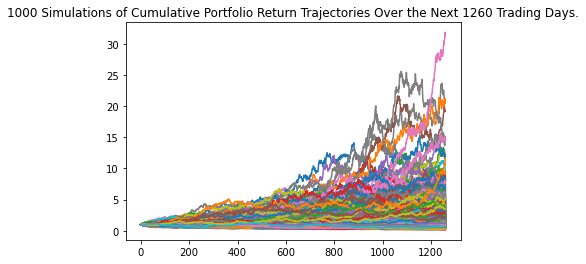

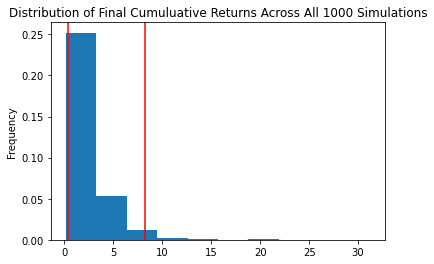


count           1000.000000
mean               2.393371
std                2.401964
min                0.151600
25%                0.987057
50%                1.716453
75%                2.957541
max               31.226869
95% CI Lower       0.404884
95% CI Upper       8.194419
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹4048.84 and ₹81944.19.



ITC.NS stock is being analyzed and forecasted
Volatility on ITC.NS stock:  close    1100.407017
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of ITC.NS'

,close
Date,
2007-11-07,42.575911
2007-11-08,42.347430
2007-11-12,42.269498
2007-11-13,42.160866
2007-11-14,42.120129
...,...
2022-10-04,333.572501
2022-10-06,334.100000
2022-10-07,334.310001


'Moving average stock with 50 days  of ITC.NS'

,close
Date,
2007-12-20,43.931325
2007-12-24,43.971472
2007-12-26,44.039721
2007-12-27,44.117180
2007-12-28,44.213531
...,...
2022-10-04,320.449999
2022-10-06,321.172000
2022-10-07,321.832000


'Moving average stock with 100 days  of ITC.NS'

,close
Date,
2008-03-03,46.185313
2008-03-04,46.174332
2008-03-05,46.195940
2008-03-07,46.204441
2008-03-10,46.215895
...,...
2022-10-04,297.649843
2022-10-06,298.489611
2022-10-07,299.347848


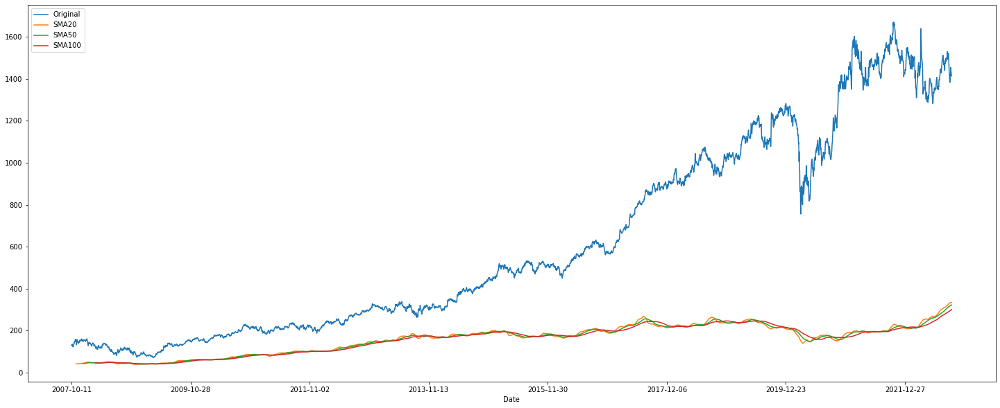

,ITC.NS
,close
Date,
2007-10-11,44.763302
2007-10-12,43.783260
2007-10-15,44.196533
2007-10-16,43.960373
2007-10-17,43.570717
...,...
2022-10-04,332.850006
2022-10-06,336.649994


ITC.NS             
                close daily_return
Date                              
2007-10-12  43.783260    -0.021894
2007-10-15  44.196533     0.009439
2007-10-16  43.960373    -0.005343
2007-10-17  43.570717    -0.008864

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

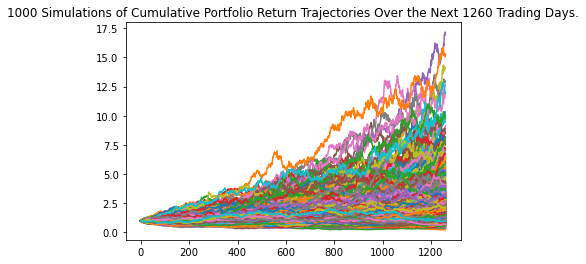

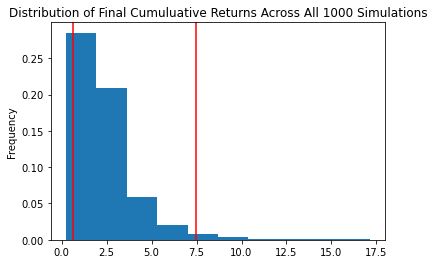


count           1000.000000
mean               2.446424
std                1.827690
min                0.221130
25%                1.281195
50%                1.950170
75%                3.029125
max               17.159461
95% CI Lower       0.622641
95% CI Upper       7.481100
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹6226.41 and ₹74811.0.



HINDUNILVR.NS stock is being analyzed and forecasted
Volatility on HINDUNILVR.NS stock:  close    12181.812832
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of HINDUNILVR.NS'

,close
Date,
2007-11-07,155.108187
2007-11-08,154.091116
2007-11-12,153.384335
2007-11-13,152.785114
2007-11-14,152.457704
...,...
2022-10-04,2622.397498
2022-10-06,2624.867493
2022-10-07,2625.994995


'Moving average stock with 50 days  of HINDUNILVR.NS'

,close
Date,
2007-12-20,155.172980
2007-12-24,155.083954
2007-12-26,155.045591
2007-12-27,155.059995
2007-12-28,155.159887
...,...
2022-10-04,2618.932012
2022-10-06,2618.400010
2022-10-07,2617.922007


'Moving average stock with 100 days  of HINDUNILVR.NS'

,close
Date,
2008-03-03,157.408207
2008-03-04,157.457760
2008-03-05,157.516530
2008-03-07,157.590441
2008-03-10,157.696228
...,...
2022-10-04,2462.235232
2022-10-06,2466.818762
2022-10-07,2471.031851


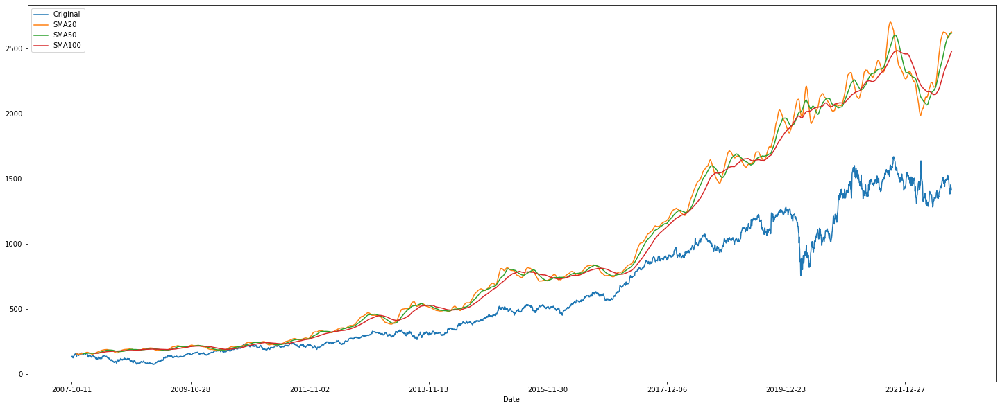

,HINDUNILVR.NS
,close
Date,
2007-10-11,166.688126
2007-10-12,163.293060
2007-10-15,161.853882
2007-10-16,157.167236
2007-10-17,154.547165
...,...
2022-10-04,2667.949951
2022-10-06,2614.000000


HINDUNILVR.NS             
                   close daily_return
Date                                 
2007-10-12    163.293060    -0.020368
2007-10-15    161.853882    -0.008813
2007-10-16    157.167236    -0.028956
2007-10-17    154.547165    -0.016671

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

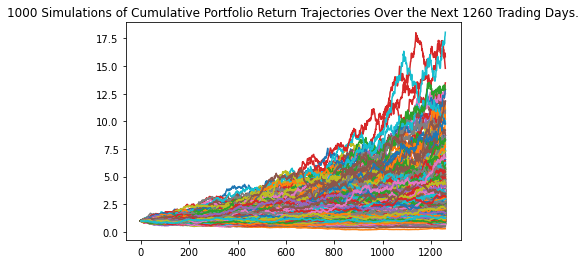

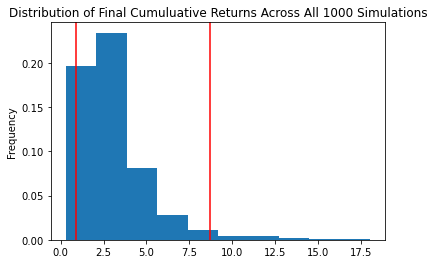


count           1000.000000
mean               3.106564
std                2.069498
min                0.291116
25%                1.786925
50%                2.615324
75%                3.778216
max               18.055767
95% CI Lower       0.867972
95% CI Upper       8.697648
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹8679.72 and ₹86976.48.



LT.NS stock is being analyzed and forecasted
Volatility on LT.NS stock:  close    6201.103882
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of LT.NS'

,close
Date,
2007-11-07,675.084158
2007-11-08,680.892859
2007-11-12,688.251709
2007-11-13,696.897461
2007-11-14,707.413733
...,...
2022-10-04,1901.657489
2022-10-06,1899.399988
2022-10-07,1896.907489


'Moving average stock with 50 days  of LT.NS'

,close
Date,
2007-12-20,727.325319
2007-12-24,729.524277
2007-12-26,732.558988
2007-12-27,735.235724
2007-12-28,738.170018
...,...
2022-10-04,1873.233999
2022-10-06,1876.137998
2022-10-07,1878.980000


'Moving average stock with 100 days  of LT.NS'

,close
Date,
2008-03-03,708.477759
2008-03-04,708.002064
2008-03-05,707.719582
2008-03-07,706.934758
2008-03-10,705.814436
...,...
2022-10-04,1724.630765
2022-10-06,1728.609288
2022-10-07,1732.620874


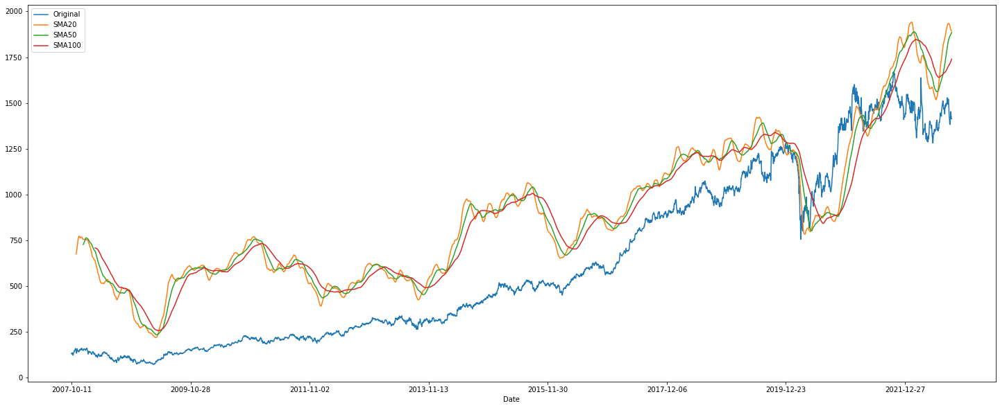

,LT.NS
,close
Date,
2007-10-11,631.501892
2007-10-12,608.455750
2007-10-15,619.684265
2007-10-16,606.525452
2007-10-17,597.227173
...,...
2022-10-04,1871.550049
2022-10-06,1912.949951


LT.NS             
                 close daily_return
Date                               
2007-10-12  608.455750    -0.036494
2007-10-15  619.684265     0.018454
2007-10-16  606.525452    -0.021235
2007-10-17  597.227173    -0.015330

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

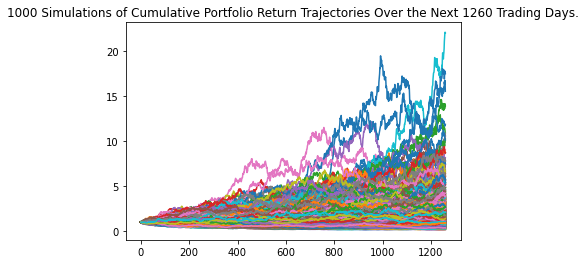

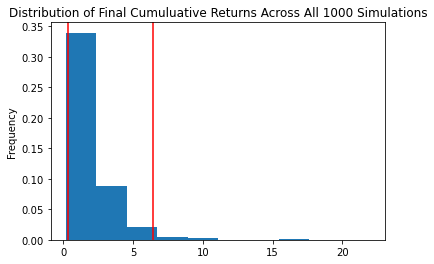


count           1000.000000
mean               1.985970
std                1.863648
min                0.178181
25%                0.873078
50%                1.522668
75%                2.422686
max               21.992776
95% CI Lower       0.333747
95% CI Upper       6.443660
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹3337.47 and ₹64436.6.



SBIN.NS stock is being analyzed and forecasted
Volatility on SBIN.NS stock:  close    1506.117693
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of SBIN.NS'

,close
Date,
2007-11-07,157.792055
2007-11-08,158.747852
2007-11-12,160.270480
2007-11-13,161.629194
2007-11-14,163.326292
...,...
2022-10-04,549.639996
2022-10-06,549.862497
2022-10-07,549.139996


'Moving average stock with 50 days  of SBIN.NS'

,close
Date,
2007-12-20,173.673694
2007-12-24,174.294695
2007-12-26,175.150791
2007-12-27,175.824691
2007-12-28,176.541292
...,...
2022-10-04,535.906998
2022-10-06,536.378998
2022-10-07,536.626998


'Moving average stock with 100 days  of SBIN.NS'

,close
Date,
2008-03-03,179.874359
2008-03-04,179.908599
2008-03-05,179.985694
2008-03-07,179.983048
2008-03-10,180.039181
...,...
2022-10-04,500.732431
2022-10-06,501.727257
2022-10-07,502.549174


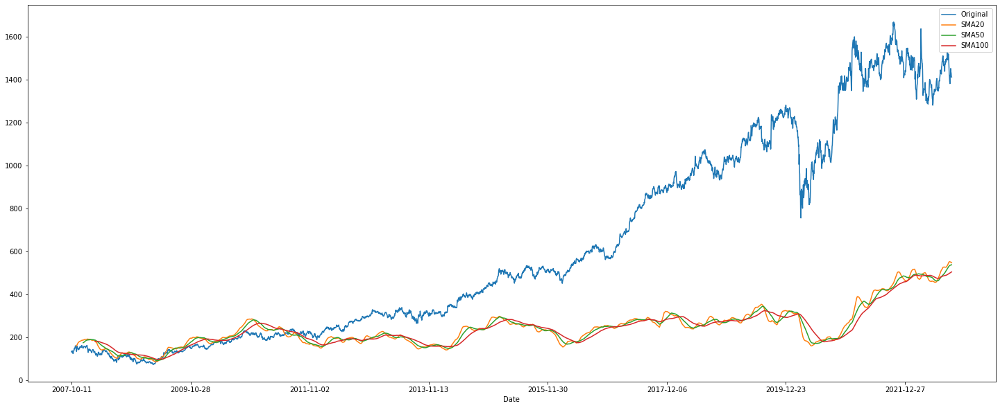

,SBIN.NS
,close
Date,
2007-10-11,154.951370
2007-10-12,148.398773
2007-10-15,155.604568
2007-10-16,153.581070
2007-10-17,145.690109
...,...
2022-10-04,532.700012
2022-10-06,537.299988


SBIN.NS             
                 close daily_return
Date                               
2007-10-12  148.398773    -0.042288
2007-10-15  155.604568     0.048557
2007-10-16  153.581070    -0.013004
2007-10-17  145.690109    -0.051380

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

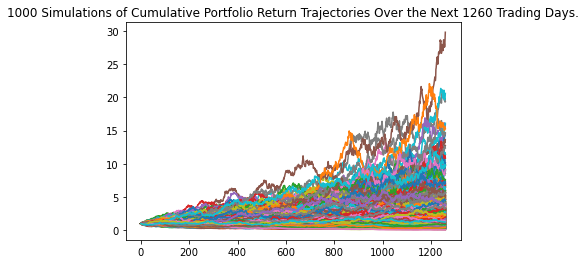

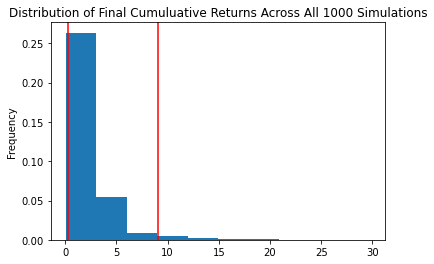


count           1000.000000
mean               2.238873
std                2.428946
min                0.058279
25%                0.859506
50%                1.514317
75%                2.822626
max               29.776027
95% CI Lower       0.284545
95% CI Upper       9.105238
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹2845.45 and ₹91052.38.



GRASIM.NS stock is being analyzed and forecasted
Volatility on GRASIM.NS stock:  close    6320.32504
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of GRASIM.NS'

,close
Date,
2007-11-07,496.624350
2007-11-08,494.863744
2007-11-12,493.452310
2007-11-13,491.715561
2007-11-14,491.113683
...,...
2022-10-04,1723.554999
2022-10-06,1720.202496
2022-10-07,1716.604999


'Moving average stock with 50 days  of GRASIM.NS'

,close
Date,
2007-12-20,496.184653
2007-12-24,495.455676
2007-12-26,495.115991
2007-12-27,494.560422
2007-12-28,494.218718
...,...
2022-10-04,1652.341514
2022-10-06,1655.670955
2022-10-07,1659.751978


'Moving average stock with 100 days  of GRASIM.NS'

,close
Date,
2008-03-03,457.943734
2008-03-04,456.584918
2008-03-05,455.413961
2008-03-07,454.021876
2008-03-10,452.669580
...,...
2022-10-04,1513.610405
2022-10-06,1515.736190
2022-10-07,1518.237766


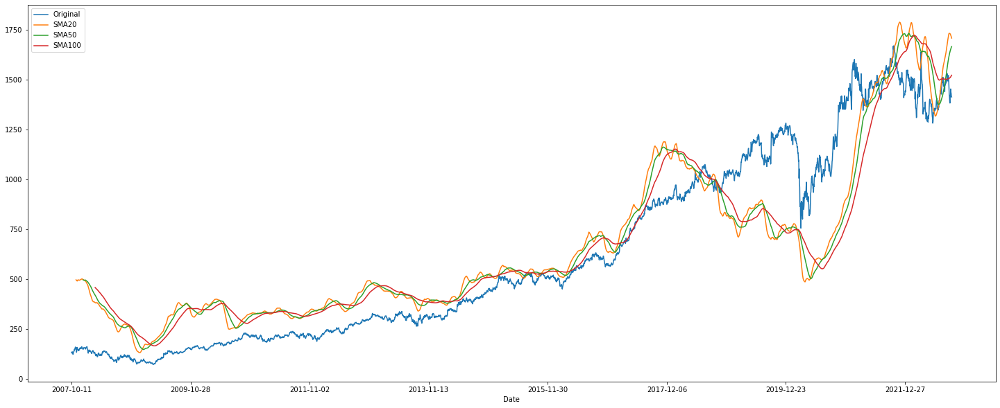

,GRASIM.NS
,close
Date,
2007-10-11,513.327820
2007-10-12,502.983765
2007-10-15,512.326294
2007-10-16,505.282532
2007-10-17,497.976562
...,...
2022-10-04,1683.900024
2022-10-06,1683.099976


GRASIM.NS             
                 close daily_return
Date                               
2007-10-12  502.983765    -0.020151
2007-10-15  512.326294     0.018574
2007-10-16  505.282532    -0.013749
2007-10-17  497.976562    -0.014459

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

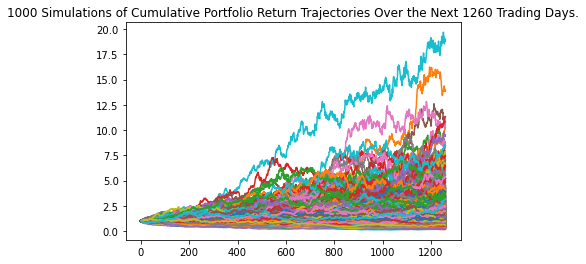

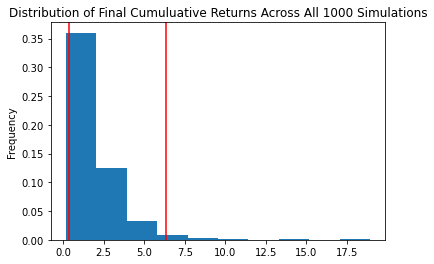


count           1000.000000
mean               1.933594
std                1.634850
min                0.165082
25%                0.936291
50%                1.478609
75%                2.407766
max               18.928445
95% CI Lower       0.349817
95% CI Upper       6.324660
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹3498.17 and ₹63246.6.



HEROMOTOCO.NS stock is being analyzed and forecasted
Volatility on HEROMOTOCO.NS stock:  close    12801.962786
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of HEROMOTOCO.NS'

,close
Date,
2007-11-07,454.774420
2007-11-08,452.178294
2007-11-12,449.353973
2007-11-13,446.121704
2007-11-14,443.514630
...,...
2022-10-04,2729.040002
2022-10-06,2718.607507
2022-10-07,2706.990002


'Moving average stock with 50 days  of HEROMOTOCO.NS'

,close
Date,
2007-12-20,445.051989
2007-12-24,444.398035
2007-12-26,443.720950
2007-12-27,442.946332
2007-12-28,442.262368
...,...
2022-10-04,2776.961387
2022-10-06,2773.882471
2022-10-07,2771.019224


'Moving average stock with 100 days  of HEROMOTOCO.NS'

,close
Date,
2008-03-03,442.564961
2008-03-04,442.678435
2008-03-05,442.788159
2008-03-07,442.790972
2008-03-10,442.810040
...,...
2022-10-04,2691.976384
2022-10-06,2694.556162
2022-10-07,2696.468586


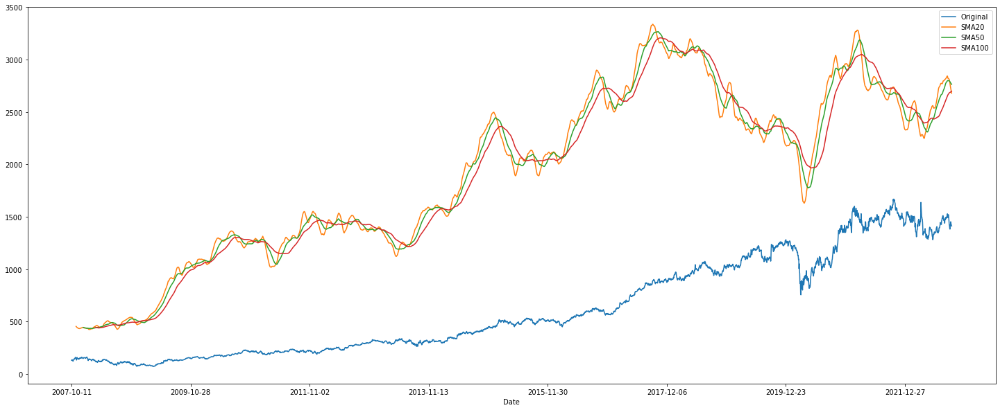

,HEROMOTOCO.NS
,close
Date,
2007-10-11,471.648407
2007-10-12,472.617432
2007-10-15,479.025818
2007-10-16,471.460938
2007-10-17,461.457764
...,...
2022-10-04,2621.800049
2022-10-06,2646.100098


HEROMOTOCO.NS             
                   close daily_return
Date                                 
2007-10-12    472.617432     0.002055
2007-10-15    479.025818     0.013559
2007-10-16    471.460938    -0.015792
2007-10-17    461.457764    -0.021217

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

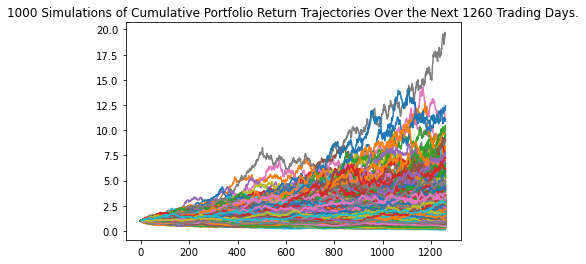

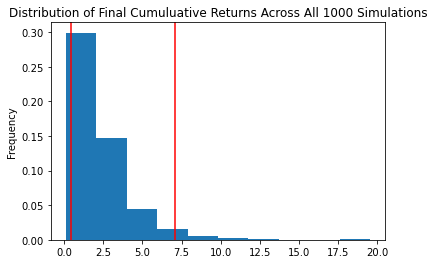


count           1000.000000
mean               2.274843
std                1.803783
min                0.107991
25%                1.065011
50%                1.776428
75%                2.882384
max               19.547342
95% CI Lower       0.446577
95% CI Upper       7.054206
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹4465.77 and ₹70542.06.



HINDALCO.NS stock is being analyzed and forecasted
Volatility on HINDALCO.NS stock:  close    1652.181237
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of HINDALCO.NS'

,close
Date,
2007-11-07,148.973887
2007-11-08,150.080962
2007-11-12,151.172195
2007-11-13,151.734641
2007-11-14,152.532765
...,...
2022-10-04,406.200000
2022-10-06,405.189999
2022-10-07,404.717500


'Moving average stock with 50 days  of HINDALCO.NS'

,close
Date,
2007-12-20,153.528141
2007-12-24,153.931362
2007-12-26,154.410633
2007-12-27,154.762361
2007-12-28,155.000016
...,...
2022-10-04,413.803139
2022-10-06,414.500441
2022-10-07,415.051798


'Moving average stock with 100 days  of HINDALCO.NS'

,close
Date,
2008-03-03,150.869976
2008-03-04,151.062873
2008-03-05,151.289437
2008-03-07,151.350831
2008-03-10,151.347266
...,...
2022-10-04,391.516251
2022-10-06,391.798015
2022-10-07,392.035048


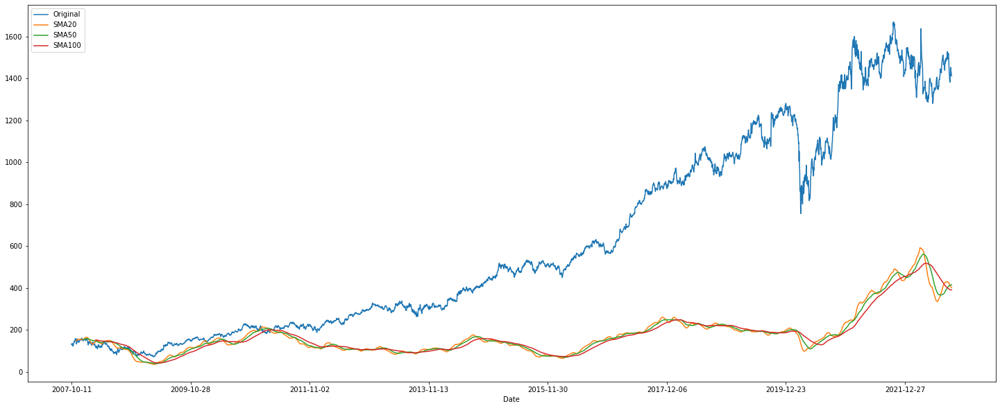

,HINDALCO.NS
,close
Date,
2007-10-11,139.384521
2007-10-12,141.998703
2007-10-15,149.524490
2007-10-16,156.535278
2007-10-17,156.574905
...,...
2022-10-04,394.049988
2022-10-06,412.649994


HINDALCO.NS             
                 close daily_return
Date                               
2007-10-12  141.998703     0.018755
2007-10-15  149.524490     0.052999
2007-10-16  156.535278     0.046887
2007-10-17  156.574905     0.000253

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

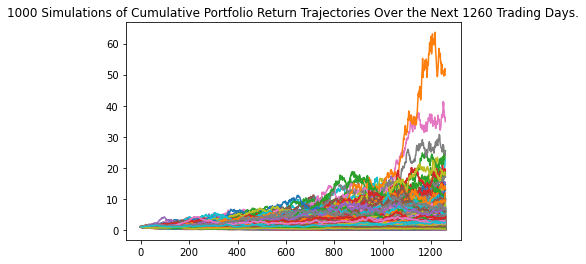

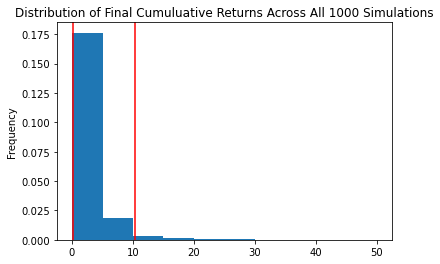


count           1000.000000
mean               2.496902
std                3.515248
min                0.064920
25%                0.723426
50%                1.413718
75%                2.972237
max               49.942400
95% CI Lower       0.167356
95% CI Upper      10.325284
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹1673.56 and ₹103252.84.



TATAMOTORS.NS stock is being analyzed and forecasted
Volatility on TATAMOTORS.NS stock:  close    2314.864314
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of TATAMOTORS.NS'

,close
Date,
2007-11-07,134.135684
2007-11-08,133.079392
2007-11-12,132.057451
2007-11-13,130.983983
2007-11-14,130.012282
...,...
2022-10-04,426.107501
2022-10-06,424.520001
2022-10-07,423.017500


'Moving average stock with 50 days  of TATAMOTORS.NS'

,close
Date,
2007-12-20,128.268285
2007-12-24,127.924260
2007-12-26,127.748211
2007-12-27,127.468079
2007-12-28,127.153940
...,...
2022-10-04,449.249000
2022-10-06,448.433000
2022-10-07,447.685000


'Moving average stock with 100 days  of TATAMOTORS.NS'

,close
Date,
2008-03-03,126.651473
2008-03-04,126.431026
2008-03-05,126.260989
2008-03-07,126.009368
2008-03-10,125.758607
...,...
2022-10-04,435.557000
2022-10-06,435.655000
2022-10-07,435.723000


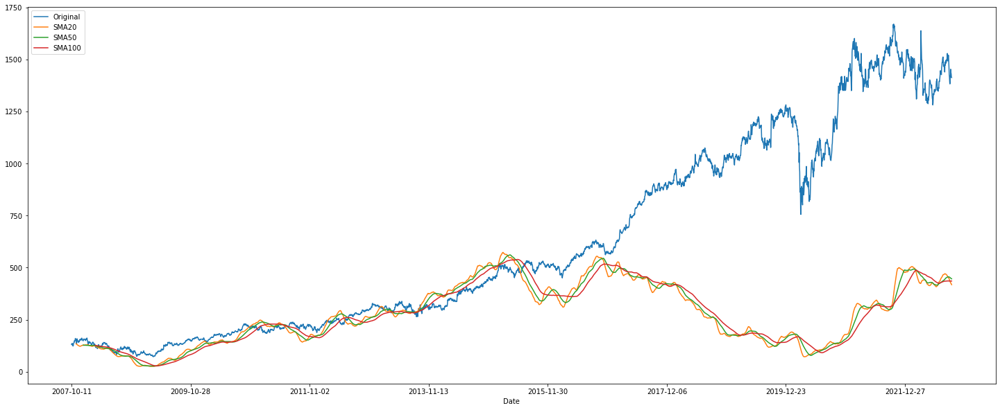

,TATAMOTORS.NS
,close
Date,
2007-10-11,142.650864
2007-10-12,137.979126
2007-10-15,140.546875
2007-10-16,140.976227
2007-10-17,138.597458
...,...
2022-10-04,407.899994
2022-10-06,414.100006


TATAMOTORS.NS             
                   close daily_return
Date                                 
2007-10-12    137.979126    -0.032749
2007-10-15    140.546875     0.018610
2007-10-16    140.976227     0.003055
2007-10-17    138.597458    -0.016874

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

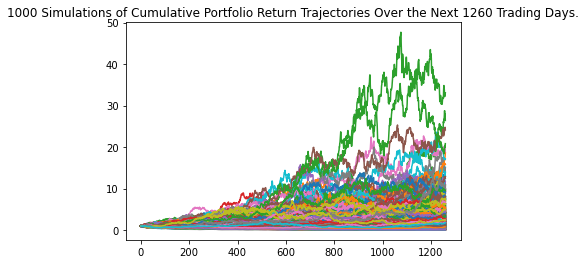

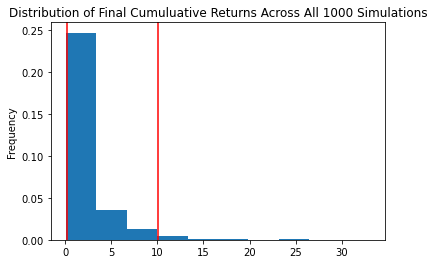


count           1000.000000
mean               2.303251
std                2.942985
min                0.074286
25%                0.699071
50%                1.394432
75%                2.649127
max               33.064538
95% CI Lower       0.183603
95% CI Upper      10.016676
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹1836.03 and ₹100166.76.



DRREDDY.NS stock is being analyzed and forecasted
Volatility on DRREDDY.NS stock:  close    20100.274865
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of DRREDDY.NS'

,close
Date,
2007-11-07,545.480795
2007-11-08,544.334811
2007-11-12,543.767340
2007-11-13,543.098294
2007-11-14,542.305600
...,...
2022-10-04,4232.462524
2022-10-06,4239.875024
2022-10-07,4245.125024


'Moving average stock with 50 days  of DRREDDY.NS'

,close
Date,
2007-12-20,560.409098
2007-12-24,561.968875
2007-12-26,563.813934
2007-12-27,565.624550
2007-12-28,567.251453
...,...
2022-10-04,4224.385986
2022-10-06,4224.866982
2022-10-07,4225.788984


'Moving average stock with 100 days  of DRREDDY.NS'

,close
Date,
2008-03-03,548.069098
2008-03-04,547.426550
2008-03-05,547.128461
2008-03-07,546.697888
2008-03-10,546.283654
...,...
2022-10-04,4240.280522
2022-10-06,4245.539990
2022-10-07,4250.944639


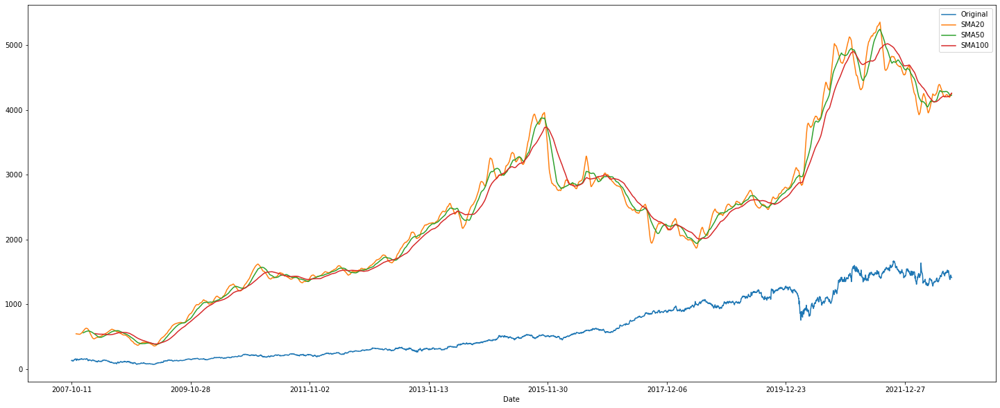

,DRREDDY.NS
,close
Date,
2007-10-11,557.360168
2007-10-12,545.260010
2007-10-15,546.010742
2007-10-16,550.073547
2007-10-17,537.222656
...,...
2022-10-04,4413.950195
2022-10-06,4397.549805


DRREDDY.NS             
                 close daily_return
Date                               
2007-10-12  545.260010    -0.021710
2007-10-15  546.010742     0.001377
2007-10-16  550.073547     0.007441
2007-10-17  537.222656    -0.023362

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

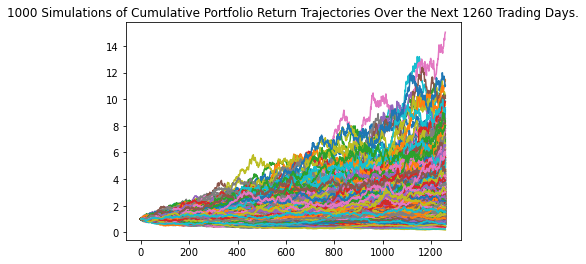

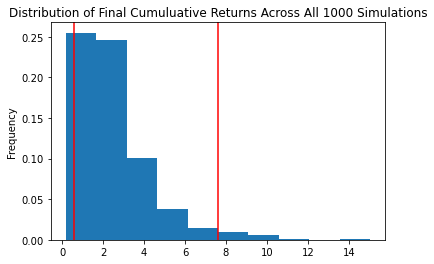


count           1000.000000
mean               2.514815
std                1.785987
min                0.181787
25%                1.311220
50%                1.999490
75%                3.189013
max               15.034270
95% CI Lower       0.600257
95% CI Upper       7.617534
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹6002.57 and ₹76175.34.



HDFCBANK.NS stock is being analyzed and forecasted
Volatility on HDFCBANK.NS stock:  close    7333.526243
dtype: float64

Mean of null values:  close    0.0
dtype: float64
Sum of null values:  close    0
dtype: int64


'Moving average stock with 20 days  of HDFCBANK.NS'

,close
Date,
2007-11-07,139.912364
2007-11-08,140.339343
2007-11-12,140.540765
2007-11-13,140.879100
2007-11-14,141.982297
...,...
2022-10-04,1470.049994
2022-10-06,1467.784991
2022-10-07,1464.444995


'Moving average stock with 50 days  of HDFCBANK.NS'

,close
Date,
2007-12-20,146.089277
2007-12-24,146.517743
2007-12-26,147.012254
2007-12-27,147.456690
2007-12-28,147.858271
...,...
2022-10-04,1462.615000
2022-10-06,1463.505000
2022-10-07,1464.189001


'Moving average stock with 100 days  of HDFCBANK.NS'

,close
Date,
2008-03-03,144.414565
2008-03-04,144.316267
2008-03-05,144.226089
2008-03-07,144.030351
2008-03-10,143.853289
...,...
2022-10-04,1405.671503
2022-10-06,1407.128003
2022-10-07,1408.385004


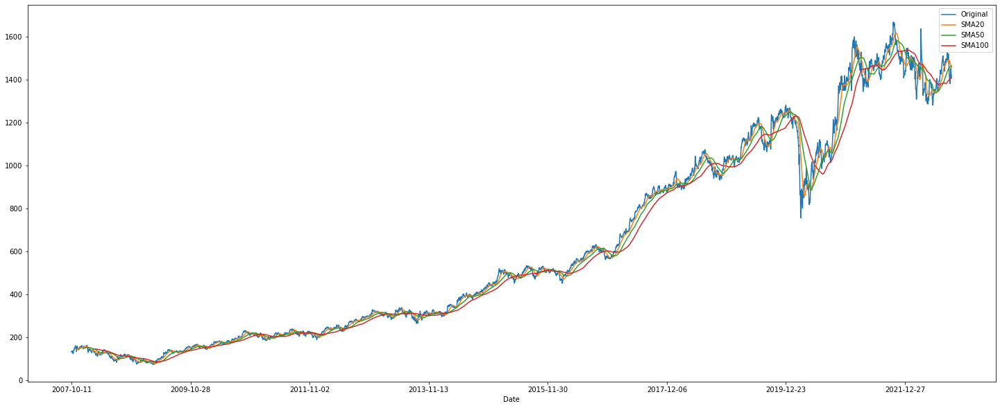

,HDFCBANK.NS
,close
Date,
2007-10-11,131.788269
2007-10-12,129.262039
2007-10-15,135.261826
2007-10-16,136.033249
2007-10-17,131.973206
...,...
2022-10-04,1453.000000
2022-10-06,1437.000000


HDFCBANK.NS             
                 close daily_return
Date                               
2007-10-12  129.262039    -0.019169
2007-10-15  135.261826     0.046416
2007-10-16  136.033249     0.005703
2007-10-17  131.973206    -0.029846

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

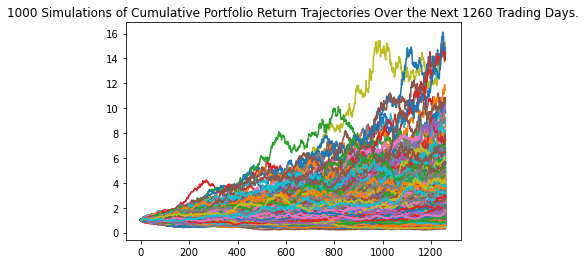

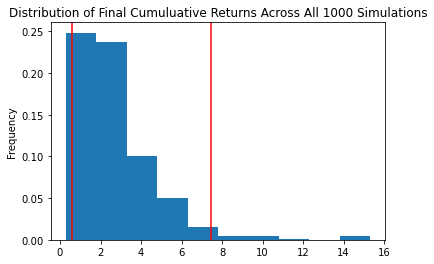


count           1000.000000
mean               2.714490
std                1.934599
min                0.283754
25%                1.447490
50%                2.233685
75%                3.428126
max               15.305429
95% CI Lower       0.605856
95% CI Upper       7.450284
Name: 1260, dtype: float64

There is a 95% chance that an initial investment of  ₹10,000 in the stock over the next 5 years will end within in the range of ₹6058.56 and ₹74502.84.





In [79]:
results()

In [10]:
!jupyter nbconvert Financial_Analysis.ipynb --no-input --no-prompt --to html

[NbConvertApp] Converting notebook Financial_Analysis.ipynb to html
[NbConvertApp] Writing 7232757 bytes to Financial_Analysis.html


In [1]:
!jupyter-nbconvert Financial_Analysis.ipynb --no-input --no-prompt --to pdfviahtml

[NbConvertApp] Converting notebook Financial_Analysis.ipynb to pdfviahtml
[NbConvertApp] Writing 12495477 bytes to Financial_Analysis.pdf
